In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing,
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
from PIL import Image
from IPython.display import display
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.optim.lr_scheduler import StepLR
from torchsummary import summary
from tqdm import tqdm
import torchvision.models as models
import PIL
from torchvision.models import resnet50, ResNet50_Weights
!pip install timm
import timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-26-53de948edd5f>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


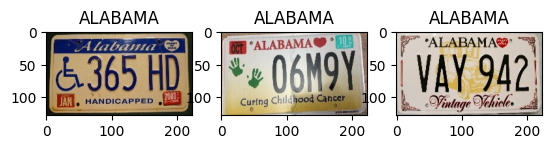

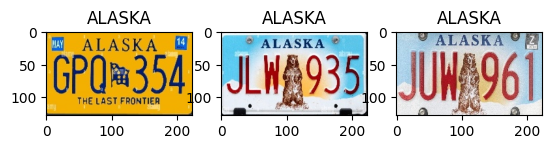

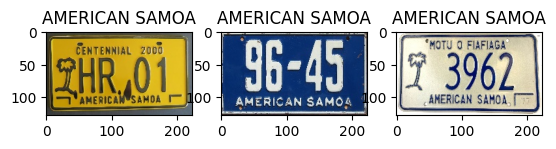

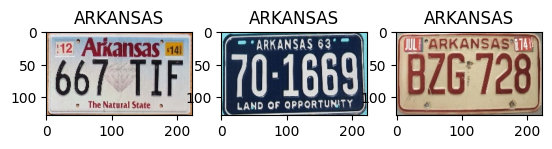

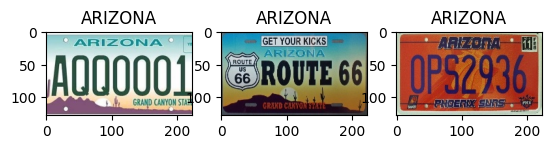

...

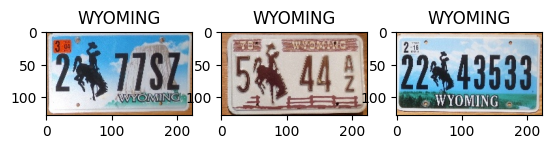

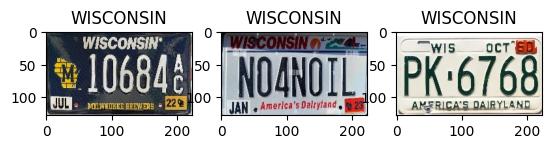

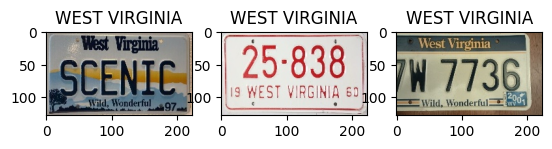

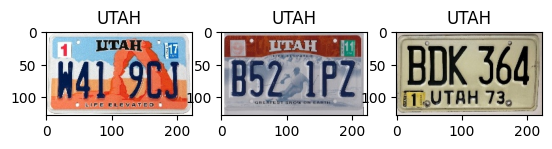

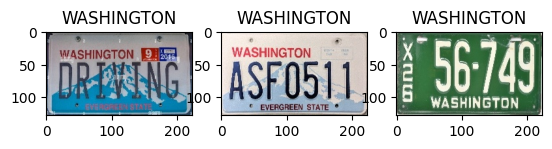

In [26]:
from google.colab import drive
drive.mount('/content/drive')
torch.manual_seed(0)
data_path = '/content/drive/MyDrive/pytorch'
directory= os.listdir(data_path + '/train')
for each in directory:
    plt.figure()
    currentFolder = data_path + '/train/' + each
    for i, file in enumerate(os.listdir(currentFolder)[0:3]):
        fullpath = data_path + '/train/' + each + "/" + file
        img=mpimg.imread(fullpath)
        ax=plt.subplot(1,3,i+1)
        ax.set_title(each)
        plt.imshow(img)

In [29]:
from torch.utils.data import random_split
train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=20),
    transforms.GaussianBlur(5, sigma=0.60),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                          [0.229, 0.224, 0.225]), transforms.RandomErasing()])
test_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                          [0.229, 0.224, 0.225])])
train_data = datasets.ImageFolder(os.path.join(data_path, 'train'), transform= train_transform)
test_data = datasets.ImageFolder(os.path.join(data_path, 'test'), transform= test_transform)
train_loader = DataLoader(train_data,
                          batch_size= 32, shuffle= True, pin_memory= True)
test_loader = DataLoader(test_data,
                         batch_size= 32, shuffle= False, pin_memory= True)
validation_data = datasets.ImageFolder(os.path.join(data_path, 'valid'), transform= test_transform)
validation_loader = DataLoader(validation_data, batch_size=32, shuffle=False, pin_memory=True)
train_size = int(0.8 * len(train_data))
val_size = len(train_data) - train_size
train_subset, val_subset = random_split(train_data, [train_size, val_size])
print(f'Number of validation images: {len(val_subset)}')
print(f'Number of train images: {len(train_data)}')
print(f'Number of test images: {len(test_data)}')

Number of validation images: 1633
Number of train images: 8161
Number of test images: 280


In [4]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print("Available processor {}".format(device))
model = models.resnet50(weights=ResNet50_Weights.DEFAULT)
#MODEL_NAME = 'resnext50d_32x4d'
#model = timm.models.create_model(MODEL_NAME, pretrained=True)


Available processor cuda


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 136MB/s]


In [5]:
train_losses = []
test_losses = []
train_acc = []
test_acc = []
lambda1=0.005
criterion = nn.CrossEntropyLoss()
def train(model, device, train_loader, optimizer, epoch):
    model.train()
    pbar = tqdm(train_loader)
    correct = 0
    processed = 0
    for batch_idx, (data, target) in enumerate(pbar):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        y_pred = model(data)
        loss = criterion(y_pred, target)
        #l1 = 0
        #for p in model.parameters():
            #l1=l1+p.abs().sum()
        #loss = loss+lambda1*l1.detach()
        train_losses.append(loss.detach())
        loss.backward()
        optimizer.step()
        pred = y_pred.argmax(dim=1, keepdim=True)
        correct += pred.eq(target.view_as(pred)).sum().item()
        processed += len(data)
        pbar.set_description(desc= f'Loss={loss.item()} Batch_id={batch_idx} Accuracy={100*correct/processed:0.2f}')
        train_acc.append(100*correct/processed)
def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += criterion(output, target).detach()#F.nll_loss(output, target, reduction='sum').item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
    test_loss /= len(test_loader.dataset)
    test_losses.append(test_loss)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.2f}%)\n'.format(
            test_loss, correct, len(test_loader.dataset),
            100. * correct / len(test_loader.dataset)))
    test_acc.append(100. * correct / len(test_loader.dataset))
    return (100. * correct / len(test_loader.dataset))

In [6]:
def set_parameter_requires_grad(model, feature_extracting=True):
    if feature_extracting:
        for name, param in model.named_parameters():
            param.requires_grad = False

set_parameter_requires_grad(model)



In [7]:
model.fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 56),
        )

In [23]:
# enabling layer4 for learning parameters
for name, param in model.named_parameters():
    if 'layer4' in name:
        param.requires_grad = True



In [22]:

params_to_update = []
for name,param in model.named_parameters():
    if param.requires_grad == True:
        params_to_update.append(param)




In [12]:
model =  model.to(device)
print(model.fc)




Sequential(
  (0): Linear(in_features=2048, out_features=1024, bias=True)
  (1): ReLU()
  (2): Linear(in_features=1024, out_features=512, bias=True)
  (3): ReLU()
  (4): Linear(in_features=512, out_features=256, bias=True)
  (5): ReLU()
  (6): Linear(in_features=256, out_features=56, bias=True)
)


  0%|          | 0/100 [00:00<?, ?it/s]

Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 1.87E+01


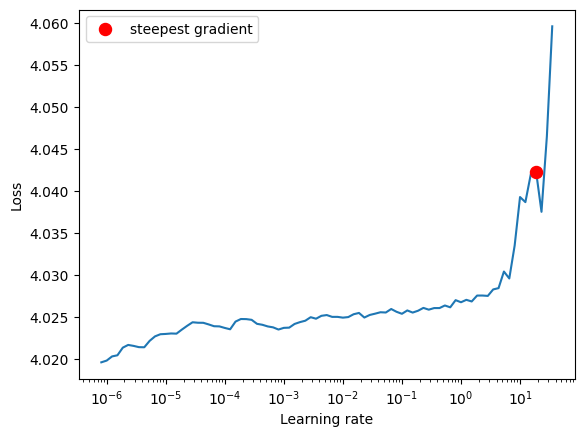

In [13]:
!pip install torch-lr-finder
from torch_lr_finder import LRFinder
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params_to_update, lr=1e-7, weight_decay=1e-2)
lr_finder = LRFinder(model, optimizer, criterion, device="cuda")
lr_finder.range_test(train_loader, end_lr=100, num_iter=100)
lr_finder.plot() # to inspect the loss-learning rate graph
lr_finder.reset() # to reset the model and optimizer to their initial state

In [14]:
model =  model.to(device)
lrr=0.01
optimizer = torch.optim.SGD(params_to_update, lr=0.1, momentum=0.9)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10,15], gamma=0.1)
EPOCHS = 25
for epoch in range(EPOCHS):
    print("EPOCH:", epoch)
    train(model, device, train_loader, optimizer, epoch)
    scheduler.step()
    print('current Learning Rate: ', optimizer.state_dict()["param_groups"][0]["lr"])
    test_accu=test(model, device, test_loader)

EPOCH: 0


Loss=3.9693665504455566 Batch_id=255 Accuracy=7.23: 100%|██████████| 256/256 [26:32<00:00,  6.22s/it]


current Learning Rate:  0.1

Test set: Average loss: 0.1071, Accuracy: 56/280 (20.00%)

EPOCH: 1


Loss=3.7657933235168457 Batch_id=255 Accuracy=31.97: 100%|██████████| 256/256 [01:15<00:00,  3.38it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0872, Accuracy: 108/280 (38.57%)

EPOCH: 2


Loss=4.771204948425293 Batch_id=255 Accuracy=49.33: 100%|██████████| 256/256 [01:15<00:00,  3.37it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0585, Accuracy: 144/280 (51.43%)

EPOCH: 3


Loss=3.6244983673095703 Batch_id=255 Accuracy=60.62: 100%|██████████| 256/256 [01:15<00:00,  3.40it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0560, Accuracy: 166/280 (59.29%)

EPOCH: 4


Loss=4.4916181564331055 Batch_id=255 Accuracy=68.37: 100%|██████████| 256/256 [01:15<00:00,  3.39it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0461, Accuracy: 180/280 (64.29%)

EPOCH: 5


Loss=2.9044270515441895 Batch_id=255 Accuracy=73.56: 100%|██████████| 256/256 [01:15<00:00,  3.38it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0393, Accuracy: 200/280 (71.43%)

EPOCH: 6


Loss=3.9905314445495605 Batch_id=255 Accuracy=76.80: 100%|██████████| 256/256 [01:15<00:00,  3.37it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0374, Accuracy: 210/280 (75.00%)

EPOCH: 7


Loss=4.313464164733887 Batch_id=255 Accuracy=81.13: 100%|██████████| 256/256 [01:15<00:00,  3.38it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0335, Accuracy: 218/280 (77.86%)

EPOCH: 8


Loss=3.9224343299865723 Batch_id=255 Accuracy=81.22: 100%|██████████| 256/256 [01:15<00:00,  3.38it/s]


current Learning Rate:  0.1

Test set: Average loss: 0.0302, Accuracy: 218/280 (77.86%)

EPOCH: 9


Loss=2.45013165473938 Batch_id=255 Accuracy=84.70: 100%|██████████| 256/256 [01:15<00:00,  3.39it/s]


current Learning Rate:  0.010000000000000002

Test set: Average loss: 0.0374, Accuracy: 205/280 (73.21%)

EPOCH: 10


Loss=4.339202880859375 Batch_id=255 Accuracy=89.54: 100%|██████████| 256/256 [01:15<00:00,  3.38it/s]


current Learning Rate:  0.010000000000000002

Test set: Average loss: 0.0230, Accuracy: 230/280 (82.14%)

EPOCH: 11


Loss=4.515742778778076 Batch_id=255 Accuracy=92.08: 100%|██████████| 256/256 [01:15<00:00,  3.38it/s]


current Learning Rate:  0.010000000000000002

Test set: Average loss: 0.0186, Accuracy: 240/280 (85.71%)

EPOCH: 12


Loss=0.07777975499629974 Batch_id=255 Accuracy=93.42: 100%|██████████| 256/256 [01:15<00:00,  3.37it/s]


current Learning Rate:  0.010000000000000002

Test set: Average loss: 0.0197, Accuracy: 239/280 (85.36%)

EPOCH: 13


Loss=3.804702043533325 Batch_id=255 Accuracy=94.28: 100%|██████████| 256/256 [01:15<00:00,  3.39it/s]


current Learning Rate:  0.010000000000000002

Test set: Average loss: 0.0204, Accuracy: 238/280 (85.00%)

EPOCH: 14


Loss=5.255461692810059 Batch_id=255 Accuracy=94.45: 100%|██████████| 256/256 [01:16<00:00,  3.37it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0205, Accuracy: 239/280 (85.36%)

EPOCH: 15


Loss=0.7826989889144897 Batch_id=255 Accuracy=94.89: 100%|██████████| 256/256 [01:15<00:00,  3.38it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0179, Accuracy: 244/280 (87.14%)

EPOCH: 16


Loss=4.9516987800598145 Batch_id=255 Accuracy=95.17: 100%|██████████| 256/256 [01:15<00:00,  3.41it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0186, Accuracy: 241/280 (86.07%)

EPOCH: 17


Loss=2.7891311645507812 Batch_id=255 Accuracy=95.15: 100%|██████████| 256/256 [01:15<00:00,  3.39it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0193, Accuracy: 240/280 (85.71%)

EPOCH: 18


Loss=0.33852246403694153 Batch_id=255 Accuracy=95.37: 100%|██████████| 256/256 [01:15<00:00,  3.37it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0189, Accuracy: 241/280 (86.07%)

EPOCH: 19


Loss=3.1489222049713135 Batch_id=255 Accuracy=95.10: 100%|██████████| 256/256 [01:15<00:00,  3.39it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0174, Accuracy: 248/280 (88.57%)

EPOCH: 20


Loss=0.07384542375802994 Batch_id=255 Accuracy=95.36: 100%|██████████| 256/256 [01:15<00:00,  3.40it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0182, Accuracy: 240/280 (85.71%)

EPOCH: 21


Loss=5.912693977355957 Batch_id=255 Accuracy=95.11: 100%|██████████| 256/256 [01:15<00:00,  3.41it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0185, Accuracy: 244/280 (87.14%)

EPOCH: 22


Loss=3.668093204498291 Batch_id=255 Accuracy=95.06: 100%|██████████| 256/256 [01:15<00:00,  3.40it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0197, Accuracy: 239/280 (85.36%)

EPOCH: 23


Loss=2.491835117340088 Batch_id=255 Accuracy=95.50: 100%|██████████| 256/256 [01:15<00:00,  3.40it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0169, Accuracy: 247/280 (88.21%)

EPOCH: 24


Loss=2.782804250717163 Batch_id=255 Accuracy=95.53: 100%|██████████| 256/256 [01:15<00:00,  3.39it/s]


current Learning Rate:  0.0010000000000000002

Test set: Average loss: 0.0193, Accuracy: 242/280 (86.43%)



In [15]:
torch.save(model, data_path+'/model_1.pth')
torch.save(model.state_dict(),data_path+'/model_state_dict.pth')


['ALABAMA', 'ALASKA', 'AMERICAN SAMOA', 'ARIZONA', 'ARKANSAS', 'CALIFORNIA', 'CNMI', 'COLORADO', 'CONNECTICUT', 'DELAWARE', 'FLORIDA', 'GEORGIA', 'GUAM', 'HAWAI', 'IDAHO', 'ILLINOIS', 'INDIANA', 'IOWA', 'KANSAS', 'KENTUCKY', 'LOUISIANA', 'MAINE', 'MARYLAND', 'MASSACHUSETTS', 'MICHIGAN', 'MINNESOTA', 'MISSIPPI', 'MISSOURI', 'MONTANA', 'NEBRASKA', 'NEVADA', 'NEW HAMPSHIRE', 'NEW JERSEY', 'NEW MEXICO', 'NEW YORK', 'NORTH CAROLINA', 'NORTH DAKOTA', 'OHIO', 'OKLAHOMA', 'OREGON', 'PENNSYLVANIA', 'PUERTO RICO', 'RHODE ISLAND', 'SOUTH CAROLINA', 'SOUTH DAKOTA', 'TENNESSEE', 'TEXAS', 'U S VIRGIN ISLANDS', 'UTAH', 'VERMONT', 'VIRGINIA', 'WASHINGTON', 'WASHINGTON DC', 'WEST VIRGINIA', 'WISCONSIN', 'WYOMING']


<ipython-input-20-d4a8cb8d08eb>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


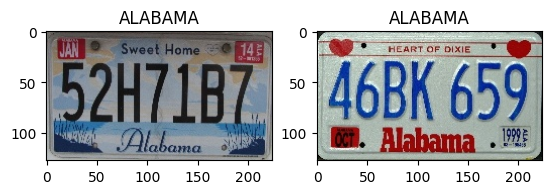

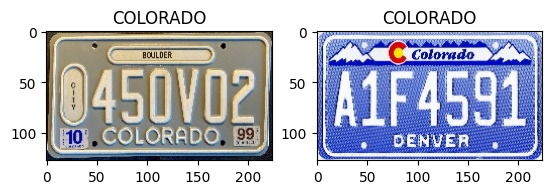

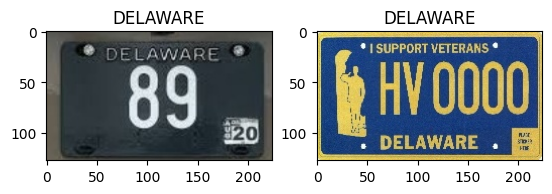

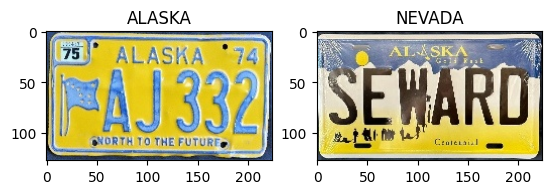

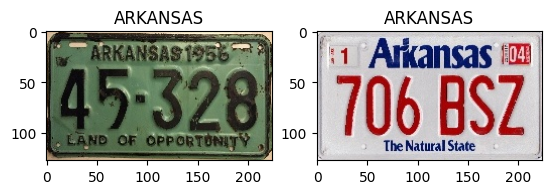

...

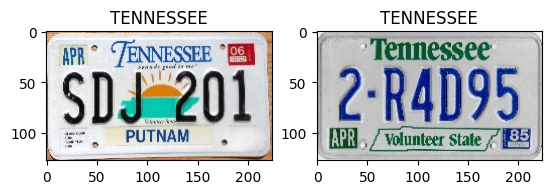

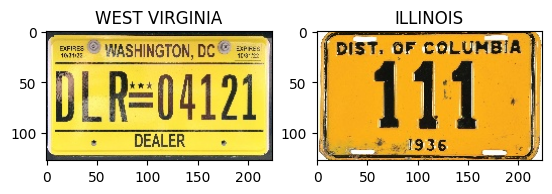

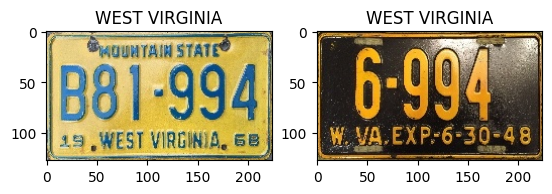

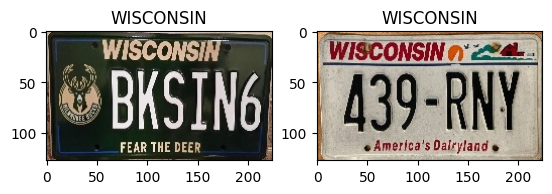

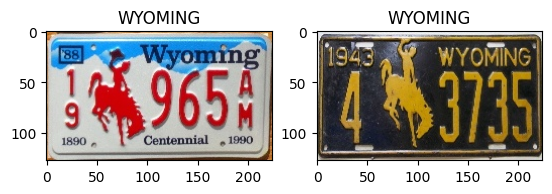

In [20]:
class_names = train_data.classes
print(class_names)
from torchvision import transforms
test_images_dir= os.listdir(data_path + '/test')
for each in test_images_dir:
    plt.figure()
    currentFolder = data_path + '/test/' + each
    for i, file in enumerate(os.listdir(currentFolder)[0:2]):
        fullpath = data_path + '/test/' + each + "/" + file
        #print(fullpath)
        #print(plt.imread(fullpath).shape)
        image_path = os.path.join(fullpath)
        image = Image.open(image_path).convert('RGB')
        image = test_transform(image).unsqueeze(0)  # Transform and add batch dimension
        image = image.to(device)
        # Make the prediction
        with torch.no_grad():
            output = model(image)
            _, predicted = torch.max(output, 1)
            state = class_names[predicted.item()]

        # print(f'Image: {file} belongs to state: {state}')
        img=mpimg.imread(fullpath)
        ax=plt.subplot(1,2,i+1)
        ax.set_title(state)
        plt.imshow(img)
# Iterate through the test images and make predictions

In [19]:
from sklearn.metrics import f1_score

# Function to calculate accuracy and F1 score
def calculate_metrics(model, device, test_loader):
    model.eval()  # Set the model to evaluation mode
    correct = 0
    total = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():  # Disable gradient calculation
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            _, predicted = torch.max(output, 1)
            correct += (predicted == target).sum().item()
            total += target.size(0)
            all_preds.extend(predicted.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    accuracy = 100 * correct / total
    f1 = f1_score(all_targets, all_preds, average='weighted')

    return accuracy, f1

# Calculate and print the metrics
validation_accuracy, f1_value = calculate_metrics(model, device, test_loader)

print(f'Validation Accuracy: {validation_accuracy:.2f}%')
print(f'F1 Score: {f1_value:.4f}')

Validation Accuracy: 86.43%
F1 Score: 0.8616


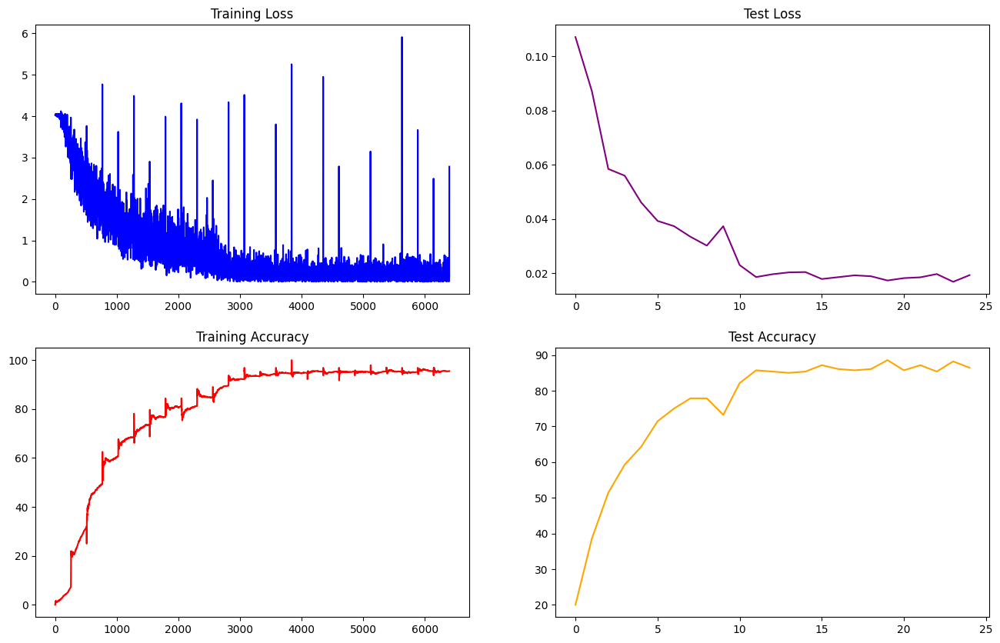

In [21]:
train_losses1 = [float(i.cpu().detach().numpy()) for i in train_losses]
train_acc1 = [i for i in train_acc]
test_losses1 = [float(i.cpu().detach().numpy()) for i in test_losses]
test_acc1 = [i for i in test_acc]

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 10))


axs[0, 0].plot(train_losses1, color='blue')
axs[0, 0].set_title("Training Loss")


axs[1, 0].plot(train_acc1, color='red')
axs[1, 0].set_title("Training Accuracy")

axs[0, 1].plot(test_losses1, color='purple')
axs[0, 1].set_title("Test Loss")

axs[1, 1].plot(test_acc1, color='orange')
axs[1, 1].set_title("Test Accuracy")

plt.show()